In [19]:
from tensorflow import keras
import os
import numpy as np
import pandas as pd
from PIL import Image
import seaborn as sns
import matplotlib.pyplot as plt
import joblib
import seaborn as sns
import librosa
import random

from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report, confusion_matrix, RocCurveDisplay, precision_recall_curve

from transformers import Resampler, BandPassFilter, MelSpectrogramTransformer, SpectrogramPadder, FlattenTransformer, FeatureExtractor, NoiseAdder, WaveletDenoiser

from config import N_MELS, SAMPLING_RATE, N_FFT, HOP_LENGTH, SEED

In [2]:
random.seed(SEED)

In [51]:
def show_precision_recall_curve(y_true, y_proba, punto_corte=0.5):
    prec, rec, thr = precision_recall_curve(y_true, y_proba)

    plt.plot(thr, rec[:-1], label='recall')
    plt.plot(thr, prec[:-1], label='precision')
    plt.xlabel('Punto de corte')
    plt.vlines(punto_corte, 0, 1, colors='red', linestyles='dashed', label='corte')
    plt.grid()
    plt.yticks(np.arange(0, 1.1, 0.1))
    plt.xticks(np.arange(0, 1.1, 0.1))
    plt.legend()
    plt.show()

def show_confusion_matrix(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Matriz de Confusión');

def load_image_dataset_pil(img_dir, to_gray=True, flatten=False, target_size=None):
    df = pd.read_csv(os.path.join(img_dir, 'labels.csv'))
    X, y = [], []
    for _, row in df.iterrows():
        path = os.path.join(img_dir, row['filename'])
        img = Image.open(path)
        
        if to_gray:
            img = img.convert('L')  # convierte a escala de grises (1 canal)
        
        if target_size:
            img = img.resize(target_size, Image.BICUBIC)
        
        img = np.array(img, dtype=np.float32)
        
        if flatten:
            img = img.flatten()
        
        X.append(img)
        y.append(row['label'])
    
    return np.array(X), np.array(y)

def load_image_dataset(img_dir, target_size=None):
    df = pd.read_csv(os.path.join(img_dir, 'labels.csv'))
    X, y = [], []
    for _, row in df.iterrows():
        path = os.path.join(img_dir, row['filename'])
        img = Image.open(path)
        
        if target_size:
            img = img.resize(target_size, Image.BICUBIC)
        
        img = np.array(img)

        X.append(img)
        y.append(row['label'])

    return np.array(X), np.array(y)

def load_images(img_dir, target_size=None):
    images = []
    for filename in os.listdir(img_dir):
        if filename.endswith('.png'):
            path = os.path.join(img_dir, filename)
            img = Image.open(path)
            
            if target_size:
                img = img.resize(target_size, Image.BICUBIC)
            
            img = np.array(img)
            images.append(img)
    return np.array(images)

def plot_melspectrogram(y, sr, ax=None):
    if ax is None:
        fig, ax = plt.subplots()
    S = librosa.feature.melspectrogram(y=y, sr=sr, n_fft=N_FFT, hop_length=HOP_LENGTH, n_mels=N_MELS)
    S_dB = librosa.power_to_db(S, ref=np.max)
    img = librosa.display.specshow(S_dB, sr=sr, x_axis='time', y_axis='mel', ax=ax)
    return img


# Audios ICBHI

In [4]:
audios_icbhi = ['107_2b3_Al_mc_AKGC417L.wav', '105_1b1_Tc_sc_Meditron.wav', '104_1b1_Al_sc_Litt3200.wav', '106_2b1_Pr_mc_LittC2SE.wav',
                '203_1p2_Tc_mc_AKGC417L.wav', '195_1b1_Ll_sc_Litt3200.wav']
paths_icbhi = [os.path.join('./dataset/audios_enteros', f) for f in audios_icbhi]

In [5]:
audios = []
for path in paths_icbhi:
    audio, sr = librosa.load(path, sr=SAMPLING_RATE)
    audios.append(audio)

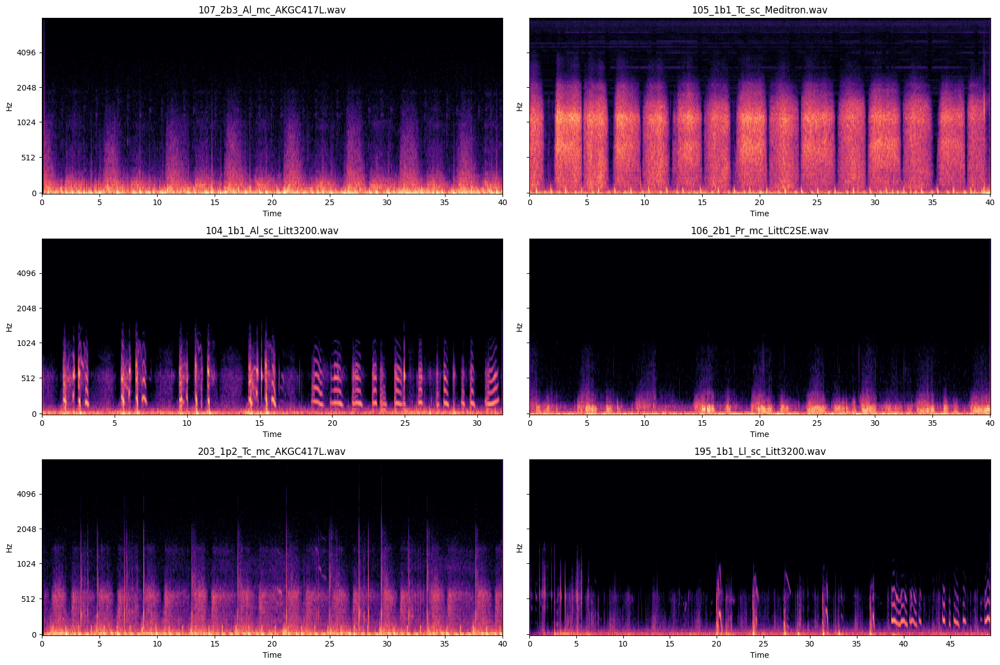

In [6]:
fig, axes = plt.subplots(3, 2, figsize=(18, 12), sharey=True)
axes = axes.flatten()
for i in range(6):
    plot_melspectrogram(audios[i], sr=SAMPLING_RATE, ax=axes[i])
    axes[i].set_title(audios_icbhi[i])
plt.tight_layout();

In [7]:
ciclos_icbhi = os.listdir('./dataset/audios_ciclos')
# keep the cycles corresponding to the selected audios_icbhi
ciclos_icbhi = [c for c in ciclos_icbhi if c.split('_')[0] in [a.split('_')[0] for a in audios_icbhi]]

In [8]:
ciclos = []
for ciclo in ciclos_icbhi:
    f = os.path.join('./dataset/audios_ciclos', ciclo)
    audio, sr = librosa.load(f, sr=SAMPLING_RATE)
    ciclos.append(audio)

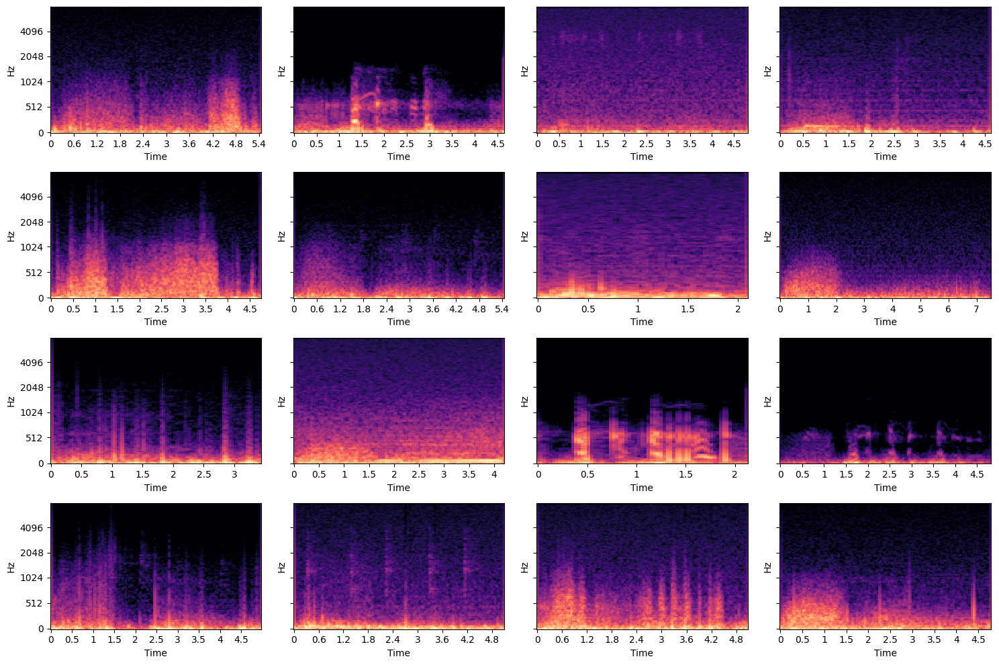

In [9]:
fig, axs = plt.subplots(4, 4, figsize=(15, 10), sharey=True)
axs = axs.flatten()
ciclos_sample = random.sample(ciclos, 16)
for i in range(16):
    plot_melspectrogram(ciclos_sample[i], sr=SAMPLING_RATE, ax=axs[i])
plt.tight_layout();

# Audios Propios

In [10]:
audios_propios = os.listdir('./audios_propios')
audios_propios = [a for a in audios_propios if a.endswith('.ogg')]

In [11]:
propios = []
for path in audios_propios:
    audio, sr = librosa.load(os.path.join('./audios_propios', path), sr=SAMPLING_RATE)
    propios.append(audio)

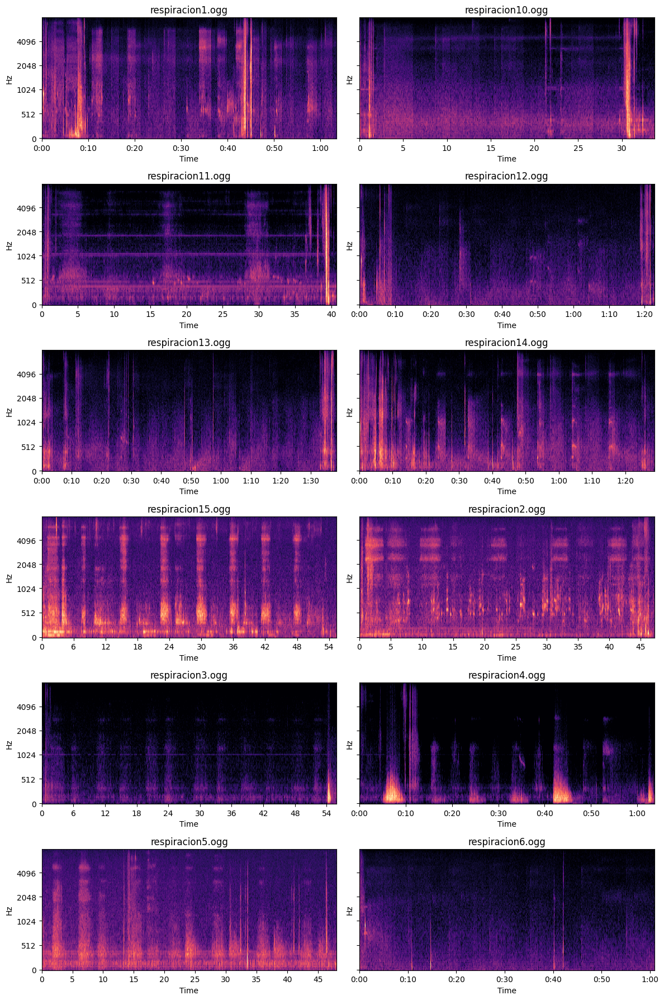

In [12]:
fig, axs = plt.subplots(6, 2, figsize=(12, 18), sharey=True)

axs = axs.flatten()
for i in range(12):
    plot_melspectrogram(propios[i], sr=SAMPLING_RATE, ax=axs[i])
    axs[i].set_title(f'{audios_propios[i]}')
plt.tight_layout();

In [13]:
path = './audios_propios/ciclos_energy_based'
files = os.listdir(path)
paths = [os.path.join(path, f) for f in files]

# Segmentador

In [14]:
ciclos_propios = []

for path in paths:
    audio, sr = librosa.load(path, sr=SAMPLING_RATE)
    ciclos_propios.append(audio)

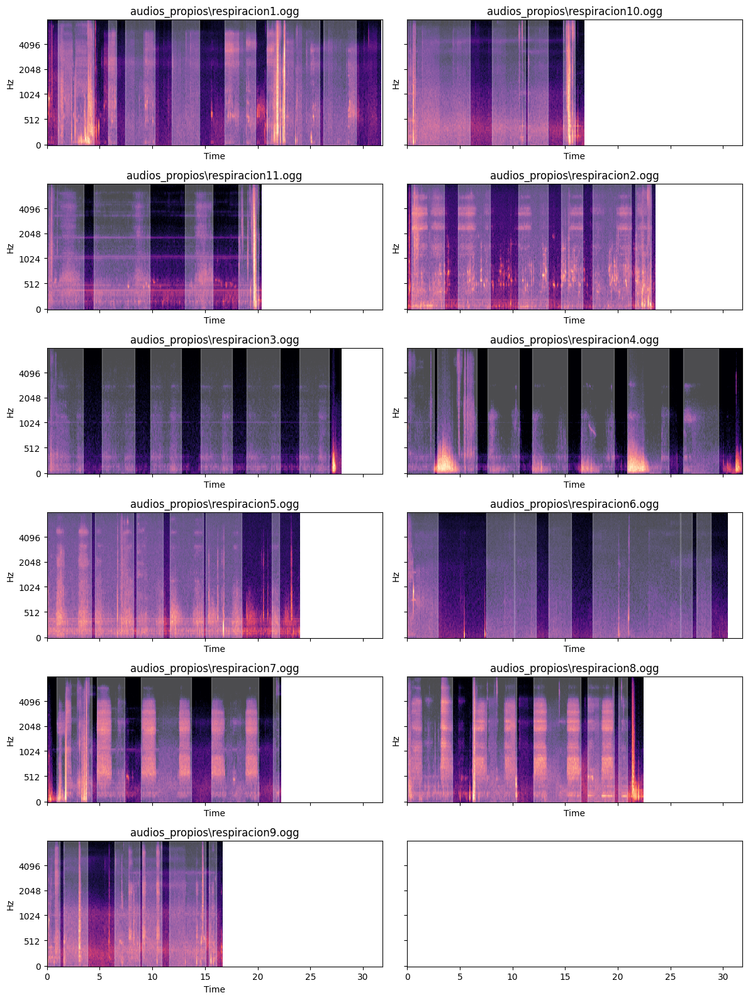

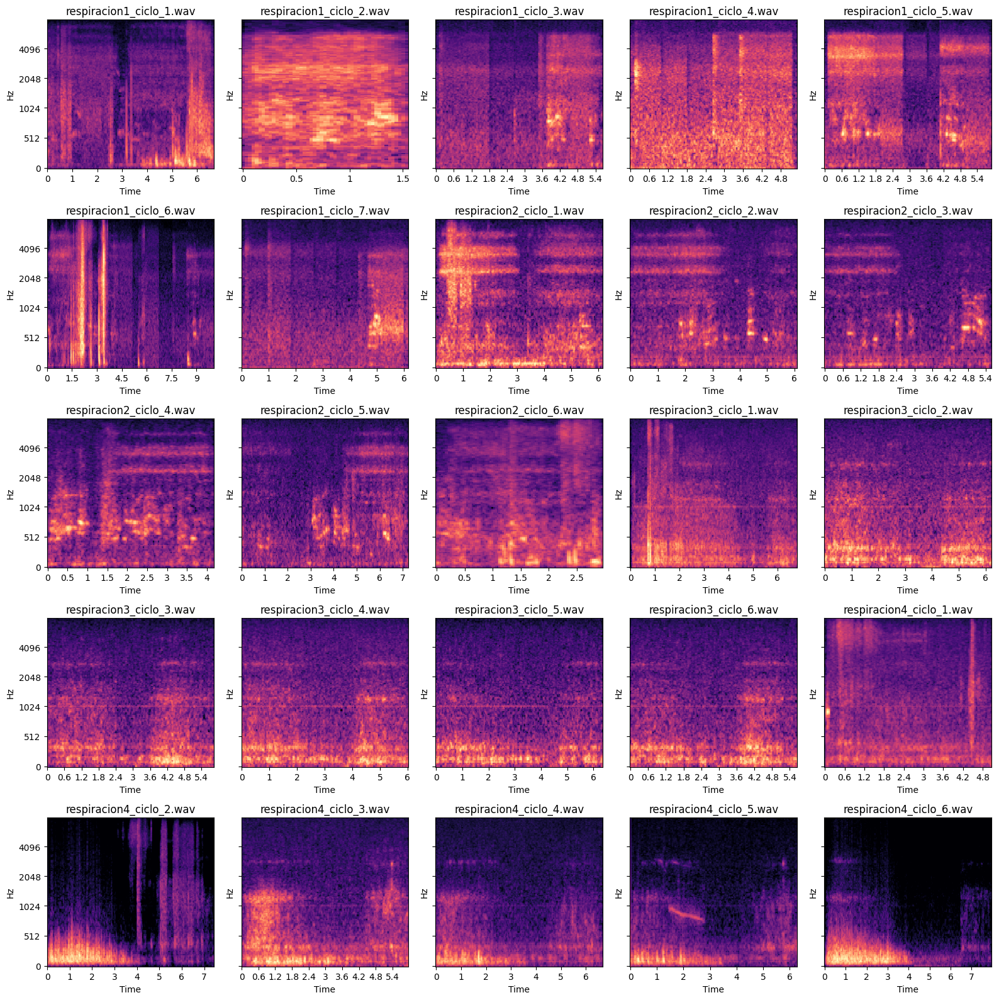

In [15]:
fig, axs = plt.subplots(5, 5, figsize=(16, 16), sharey=True)
axs = axs.flatten()

for i in range(25):
    plot_melspectrogram(ciclos_propios[i], sr=SAMPLING_RATE, ax=axs[i])
    axs[i].set_title(f'{files[i]}')
plt.tight_layout();

# Ruido

In [23]:
ruidos = os.listdir('./dataset/ruido/train')
ruidos = [os.path.join('./dataset/ruido/train', f) for f in ruidos]
ruidos_audios = []
for ruido in ruidos:
    audio, sr = librosa.load(ruido, sr=SAMPLING_RATE)
    ruidos_audios.append(audio)

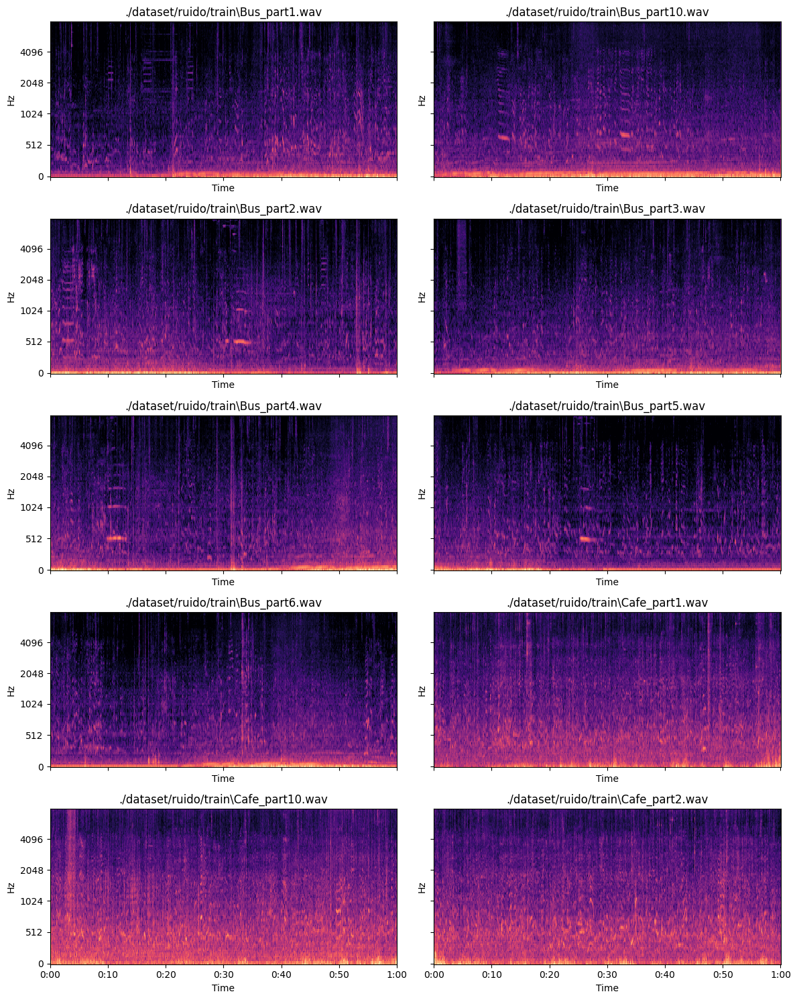

In [24]:
fig, axs = plt.subplots(5, 2, figsize=(12, 15), sharey=True, sharex=True)
axs = axs.flatten()
for i in range(10):
    plot_melspectrogram(ruidos_audios[i], sr=SAMPLING_RATE, ax=axs[i])
    axs[i].set_title(ruidos[i])
plt.tight_layout();

In [25]:
noiser = NoiseAdder(noise_files=ruidos, snr_max=4, snr_min=1)

noisy_audio = noiser.fit_transform(ciclos_sample)

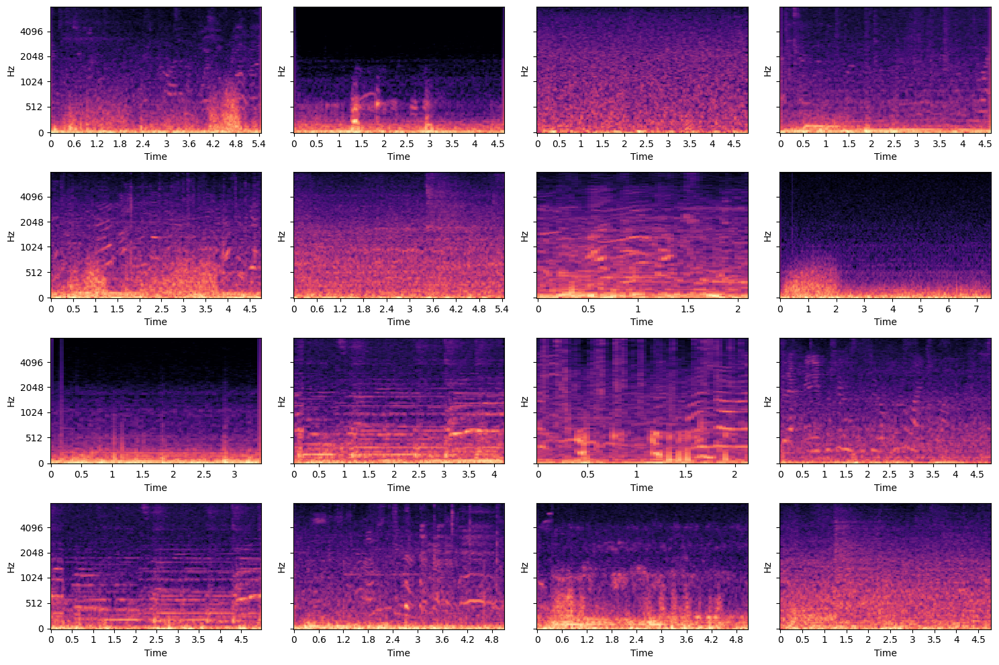

In [28]:
fig, axs = plt.subplots(4, 4, figsize=(15, 10), sharey=True)

axs = axs.flatten()
for i in range(16):
    plot_melspectrogram(noisy_audio[i], sr=SAMPLING_RATE, ax=axs[i])
plt.tight_layout();

# Procesado

In [52]:
proc = Pipeline([
    ('wavelet_denoiser', WaveletDenoiser()),
    ('bandpass', BandPassFilter())
])

In [53]:
ciclos_proc = proc.fit_transform(ciclos_sample)
noisy_proc = proc.transform(noisy_audio)

c:\Users\nazar\Clasificador-Respiracion\venv\Lib\site-packages\sklearn\pipeline.py:61: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


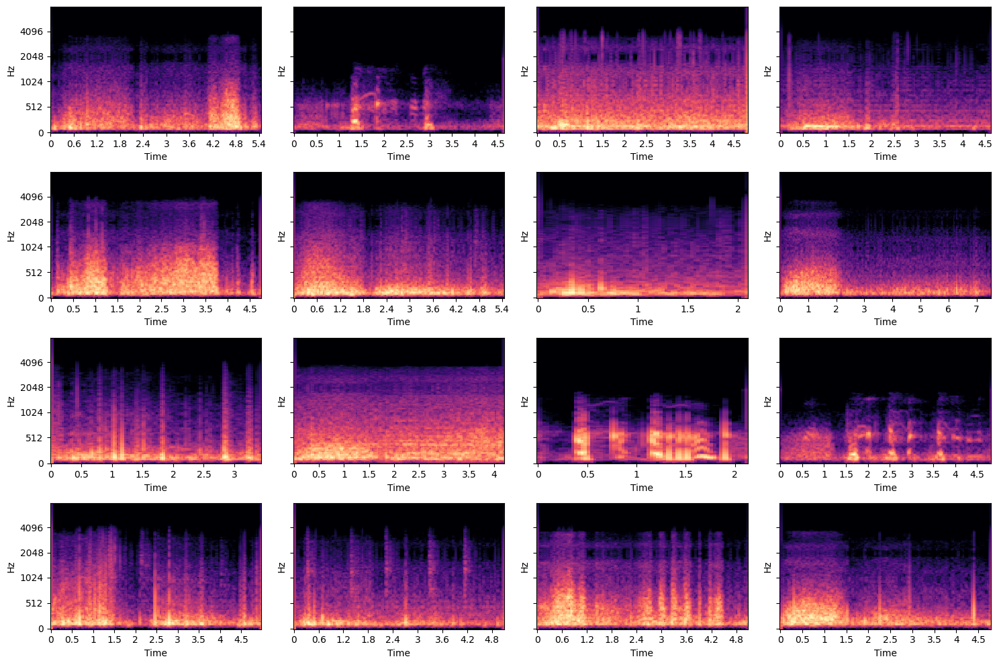

In [54]:
fig, axs = plt.subplots(4, 4, figsize=(15, 10), sharey=True)
axs = axs.flatten()
for i in range(16):
    plot_melspectrogram(ciclos_proc[i], sr=SAMPLING_RATE, ax=axs[i])
plt.tight_layout();

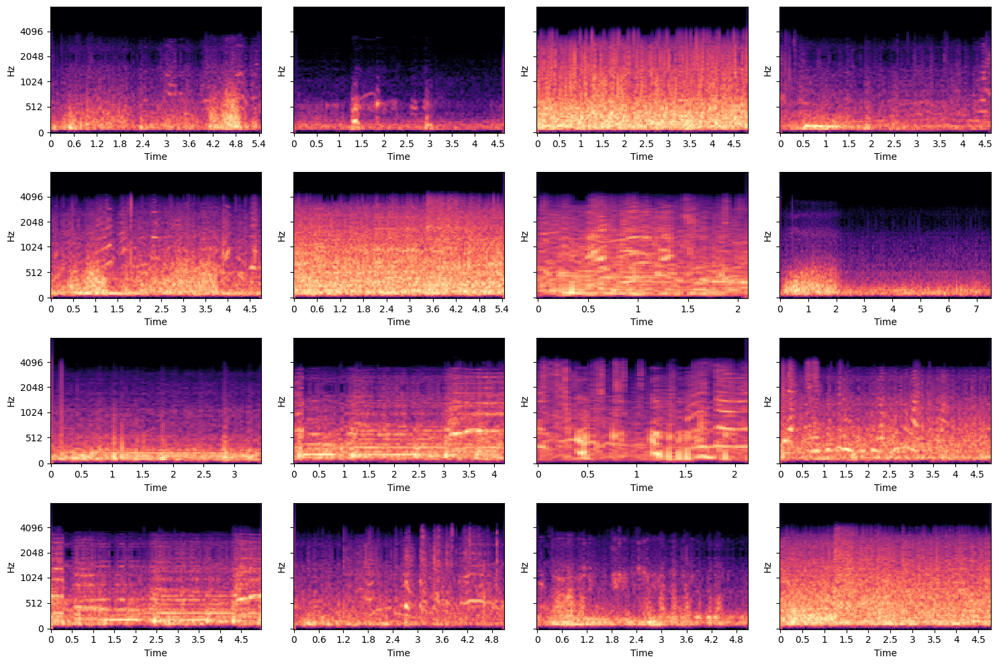

In [55]:
fig, axs = plt.subplots(4, 4, figsize=(15, 10), sharey=True)
axs = axs.flatten()
for i in range(16):
    plot_melspectrogram(noisy_proc[i], sr=SAMPLING_RATE, ax=axs[i])
plt.tight_layout();

# Modelos Datos crudos

Datos originales sin filtro ni ruido

In [252]:
dataset = 'crudos'

In [253]:
pipeline_melspec = Pipeline([
    ('resampler', Resampler()),
    ('melspec', MelSpectrogramTransformer()),
    ('padder', SpectrogramPadder()),
    ('flatten', FlattenTransformer())
])

pipeline_features = Pipeline([
    ('resampler', Resampler()),
    ('feature_extractor', FeatureExtractor())
])

## Random Forest 

### Mel Espectrogramas

In [254]:
test_data = np.load(f'./dataset/ciclos_procesados/{dataset}/test_melspectrogram.npz')
X_test = test_data['X']
y_test = test_data['y']

In [255]:
melspec_rf = joblib.load(f'./modelos_clasicos/modelos/{dataset}/melspec_rf.pkl')

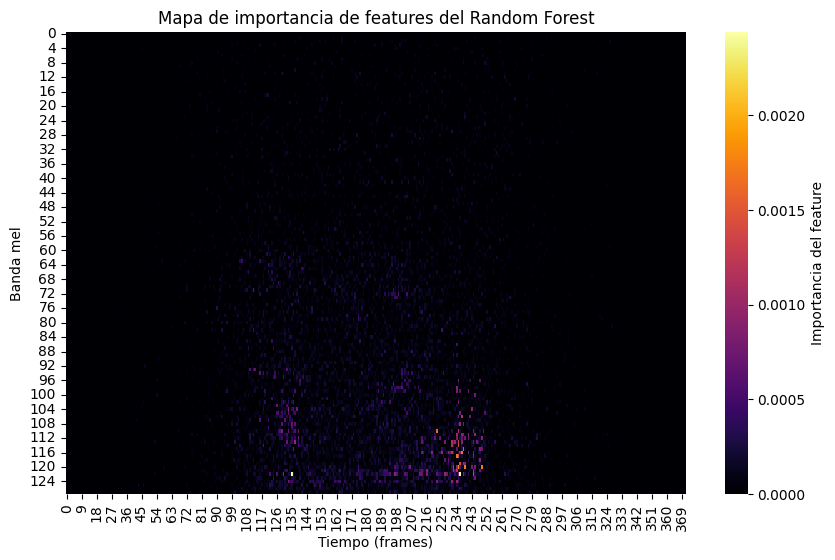

In [256]:
importances = melspec_rf.feature_importances_

n_mels = N_MELS
n_frames = importances.shape[0] // n_mels

importance_img = importances.reshape((n_mels, n_frames))
importance_img = np.flipud(importance_img)

plt.figure(figsize=(10, 6))
sns.heatmap(
    importance_img,
    cmap='inferno',
    cbar_kws={'label': 'Importancia del feature'},
)
plt.xlabel("Tiempo (frames)")
plt.ylabel("Banda mel")
plt.title("Mapa de importancia de features del Random Forest");

In [257]:
y_pred = melspec_rf.predict(X_test)
y_pred_proba = melspec_rf.predict_proba(X_test)[:, 1]

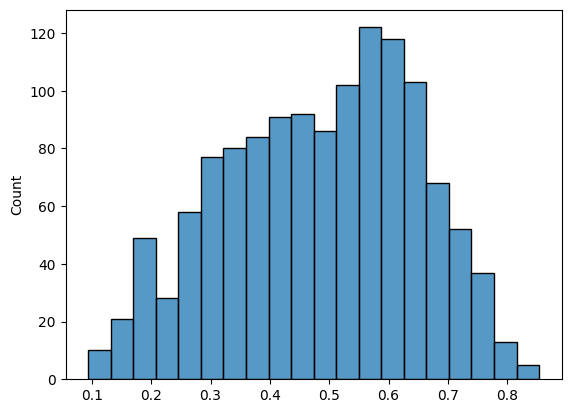

In [258]:
sns.histplot(y_pred_proba, bins=20);

In [259]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.70      0.68      0.69       663
           1       0.68      0.69      0.68       633

    accuracy                           0.69      1296
   macro avg       0.69      0.69      0.69      1296
weighted avg       0.69      0.69      0.69      1296



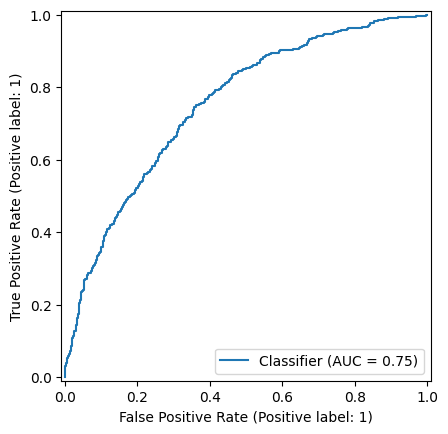

In [260]:
RocCurveDisplay.from_predictions(y_test, y_pred_proba);

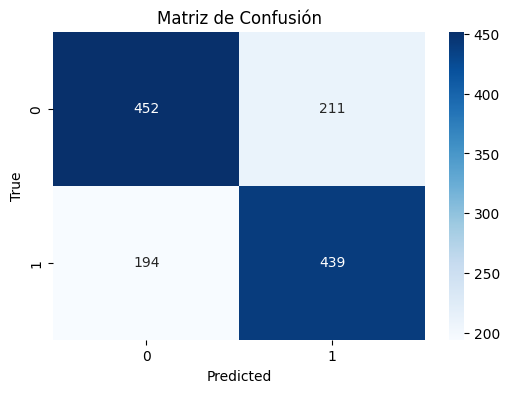

In [261]:
show_confusion_matrix(y_test, y_pred)

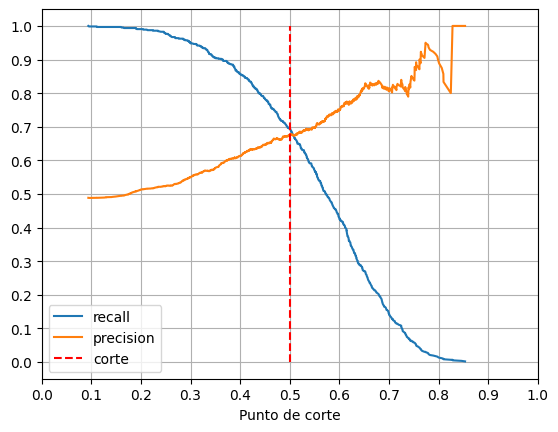

In [262]:
show_precision_recall_curve(y_test, y_pred_proba, punto_corte=0.5)

In [263]:
X_propios_melspec = pipeline_melspec.fit_transform(paths)

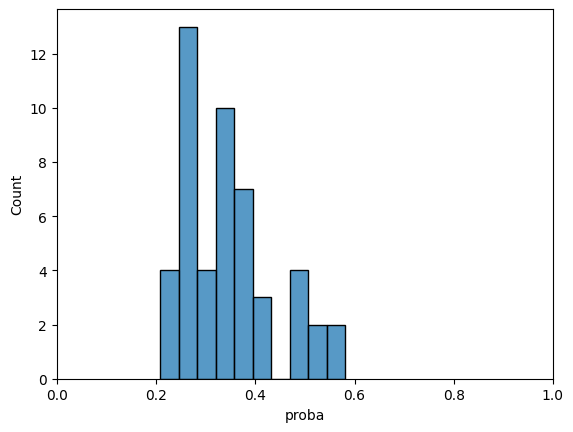

In [264]:
probas_propios = melspec_rf.predict_proba(X_propios_melspec)[:, 1]
df_probas = pd.DataFrame({
    'file': files,
    'proba': probas_propios
})
sns.histplot(df_probas, x='proba', bins=10)
plt.xlim(0, 1);

In [265]:
df_probas.sort_values(by='proba', ascending=False).head(10)

,file,proba
23,respiracion4_ciclo_5.wav,0.581616
30,respiracion5_ciclo_5.wav,0.548540
24,respiracion4_ciclo_6.wav,0.542040
36,respiracion6_ciclo_5.wav,0.507705
20,respiracion4_ciclo_2.wav,0.503550
39,respiracion7_ciclo_1.wav,0.495991
22,respiracion4_ciclo_4.wav,0.494701
0,respiracion1_ciclo_1.wav,0.479633
45,respiracion8_ciclo_2.wav,0.427091
19,respiracion4_ciclo_1.wav,0.406720


### Atributos de audio

In [266]:
test_data = np.load(f'./dataset/ciclos_procesados/{dataset}/test_features.npz')
X_test = test_data['X']
y_test = test_data['y']

In [267]:
feat_rf = joblib.load(f'./modelos_clasicos/modelos/{dataset}/features_rf.pkl')

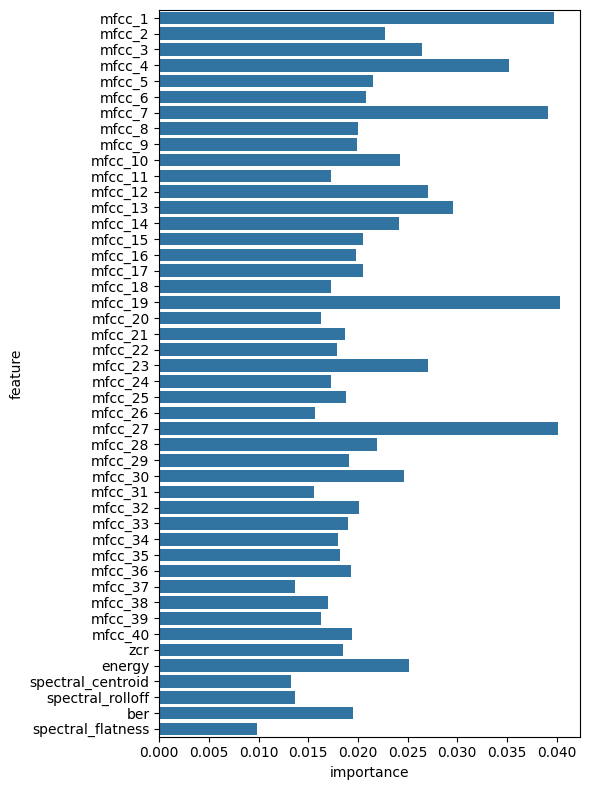

In [268]:
importances = feat_rf.feature_importances_
columns = ['mfcc_' + str(i) for i in range(1, 41)] + ['zcr', 'energy', 'spectral_centroid', 'spectral_rolloff', 'ber', 'spectral_flatness']

importance_df = pd.DataFrame({
    'feature': columns,
    'importance': importances
})
plt.figure(figsize=(6, 8))
sns.barplot(data=importance_df, x='importance', y='feature')
plt.tight_layout();

In [269]:
y_pred = feat_rf.predict(X_test)
y_pred_proba = feat_rf.predict_proba(X_test)[:, 1]

In [270]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.81      0.79      0.80       663
           1       0.79      0.80      0.79       633

    accuracy                           0.80      1296
   macro avg       0.80      0.80      0.80      1296
weighted avg       0.80      0.80      0.80      1296



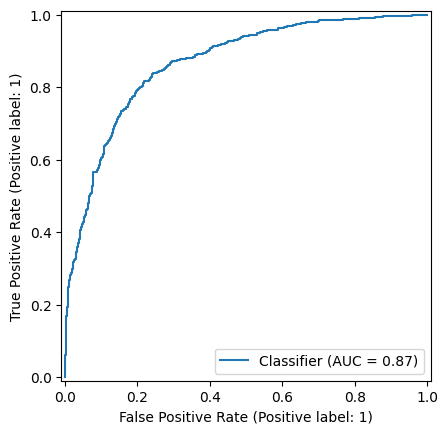

In [271]:
RocCurveDisplay.from_predictions(y_test, y_pred_proba);

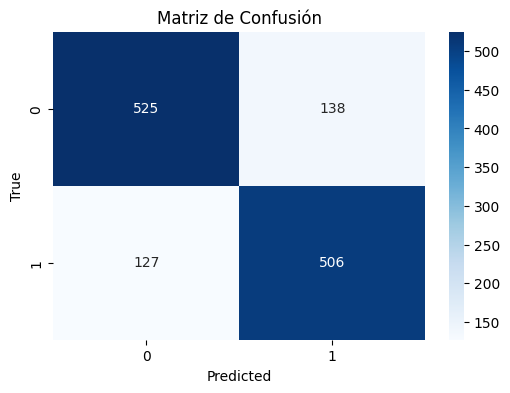

In [272]:
show_confusion_matrix(y_test, y_pred)

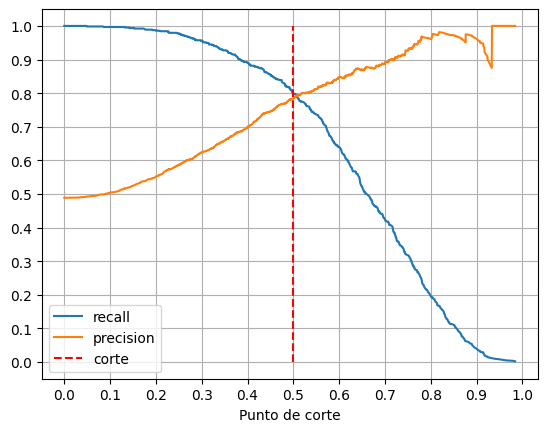

In [273]:
show_precision_recall_curve(y_test, y_pred_proba, punto_corte=0.5)

In [274]:
X_propios_features = pipeline_features.fit_transform(paths)

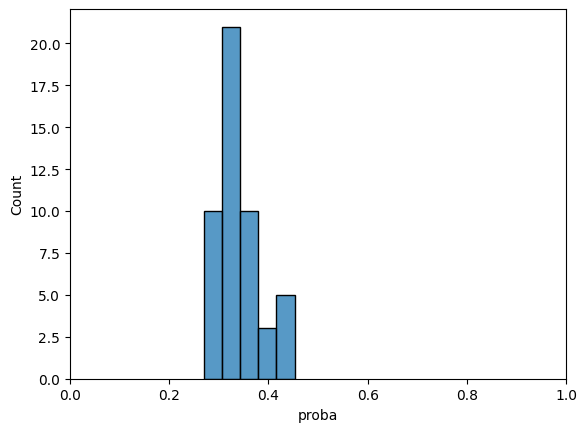

In [275]:
probas_propios = feat_rf.predict_proba(X_propios_features)[:, 1]
df_probas = pd.DataFrame({
    'file': files,
    'proba': probas_propios
})
sns.histplot(df_probas, x='proba', bins=5)
plt.xlim(0, 1);

In [276]:
df_probas.sort_values(by='proba', ascending=False).head(10)

,file,proba
46,respiracion8_ciclo_3.wav,0.452846
23,respiracion4_ciclo_5.wav,0.439128
25,respiracion4_ciclo_7.wav,0.429096
24,respiracion4_ciclo_6.wav,0.421912
22,respiracion4_ciclo_4.wav,0.417984
1,respiracion1_ciclo_2.wav,0.413458
4,respiracion1_ciclo_5.wav,0.398824
9,respiracion2_ciclo_3.wav,0.380866
8,respiracion2_ciclo_2.wav,0.371998
10,respiracion2_ciclo_4.wav,0.367867


## CNN

### Imagenes de Mel Espectrogramas

In [277]:
X_propios = load_images(f'./audios_propios/ciclos_energy_based_mel_images/pad/', target_size=(372, 128))

In [278]:
test_dir = f'./dataset/ciclos_procesados/{dataset}/cnn/test_imgs'

X_test, y_test = load_image_dataset(test_dir, target_size=(372, 128))

In [279]:
cnn_img = keras.models.load_model(f'./neural_network/modelos/{dataset}.keras')

In [280]:
y_pred_proba = cnn_img.predict(X_test)
y_pred = (y_pred_proba >= 0.5).astype(int)

41/41 ━━━━━━━━━━━━━━━━━━━━ 27s 633ms/step


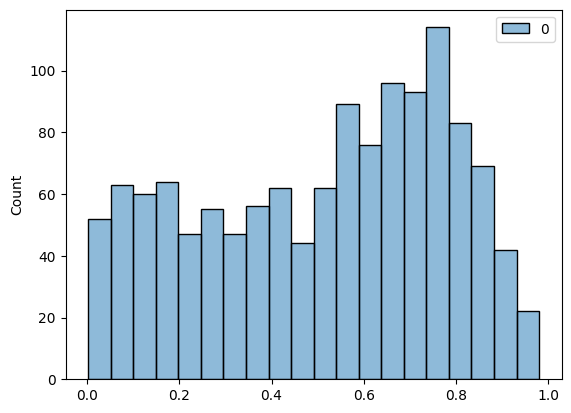

In [281]:
sns.histplot(y_pred_proba, bins=20);

In [282]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.75      0.63      0.69       663
           1       0.67      0.78      0.72       633

    accuracy                           0.70      1296
   macro avg       0.71      0.71      0.70      1296
weighted avg       0.71      0.70      0.70      1296



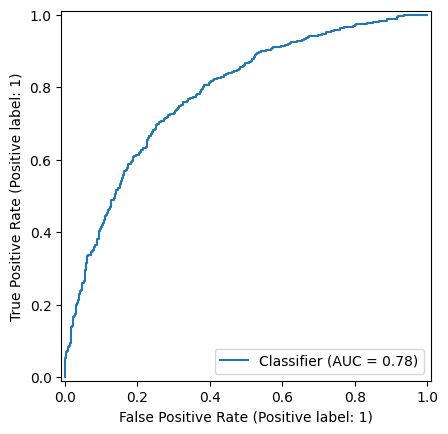

In [283]:
RocCurveDisplay.from_predictions(y_test, y_pred_proba);

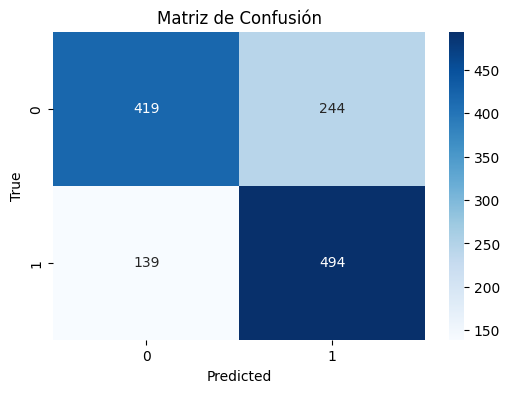

In [284]:
show_confusion_matrix(y_test, y_pred)

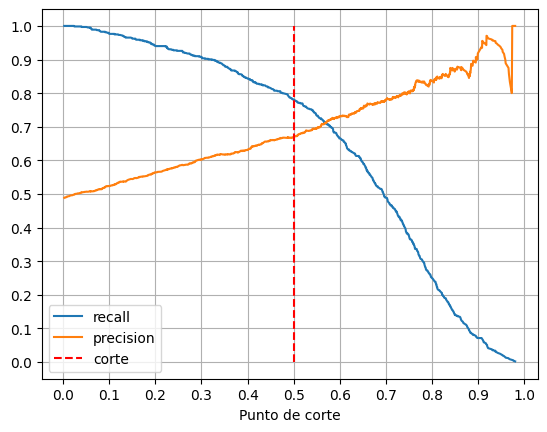

In [285]:
show_precision_recall_curve(y_test, y_pred_proba, punto_corte=0.5)

In [286]:
probas_propios = cnn_img.predict(X_propios)

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 402ms/step


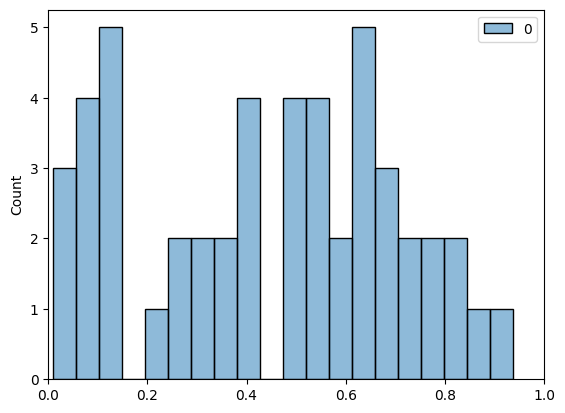

In [287]:
sns.histplot(probas_propios, bins=20)
plt.xlim(0, 1);

In [288]:
df_probas = pd.DataFrame({'file': files, 'proba': probas_propios.flatten()})
df_probas.sort_values(by='proba', ascending=False).head(10)

,file,proba
8,respiracion2_ciclo_2.wav,0.937655
19,respiracion4_ciclo_1.wav,0.877348
17,respiracion3_ciclo_5.wav,0.820487
22,respiracion4_ciclo_4.wav,0.811493
10,respiracion2_ciclo_4.wav,0.790974
13,respiracion3_ciclo_1.wav,0.757486
23,respiracion4_ciclo_5.wav,0.749195
28,respiracion5_ciclo_3.wav,0.710681
16,respiracion3_ciclo_4.wav,0.688540
21,respiracion4_ciclo_3.wav,0.678874


### Mel Espectrograma (Matriz)

In [289]:
test_data = np.load(f'./dataset/ciclos_procesados/{dataset}/cnn/test_melspectrogram.npz')
X_test = test_data['X']
y_test = test_data['y']

In [290]:
X_test = X_test.reshape(-1, 128, 372, 1)
X_test = np.repeat(X_test, 3, axis=-1)

In [291]:
X_propios_melspec_arr = X_propios_melspec.reshape(-1, 128, 372, 1)
X_propios_melspec_arr = np.repeat(X_propios_melspec_arr, 3, axis=-1)

In [292]:
cnn_melspec = keras.models.load_model(f'./neural_network/modelos/{dataset}_melspec.keras')

In [293]:
y_pred_proba = cnn_melspec.predict(X_test)
y_pred = (y_pred_proba >= 0.5).astype(int)

41/41 ━━━━━━━━━━━━━━━━━━━━ 26s 602ms/step


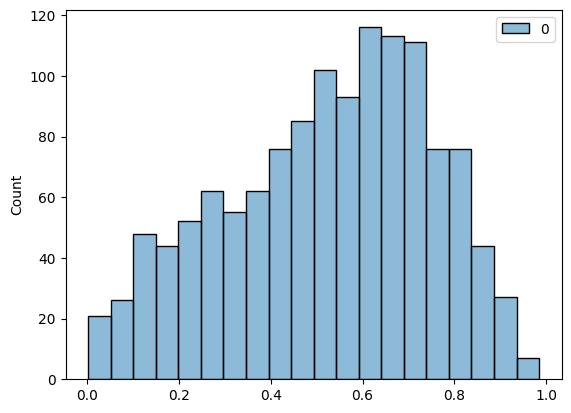

In [294]:
sns.histplot(y_pred_proba, bins=20);

In [295]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.69      0.57      0.62       663
           1       0.62      0.73      0.67       633

    accuracy                           0.65      1296
   macro avg       0.65      0.65      0.65      1296
weighted avg       0.65      0.65      0.65      1296



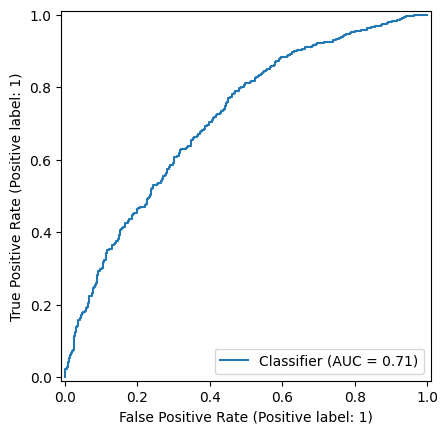

In [296]:
RocCurveDisplay.from_predictions(y_test, y_pred_proba);

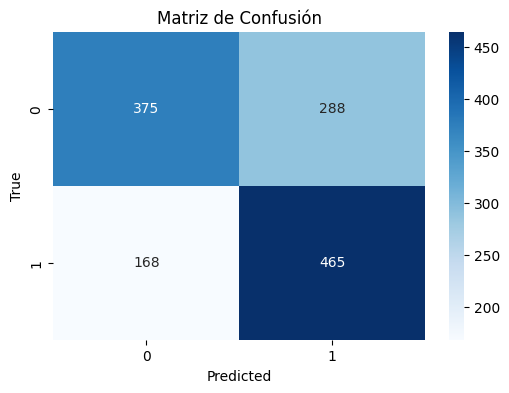

In [297]:
show_confusion_matrix(y_test, y_pred)

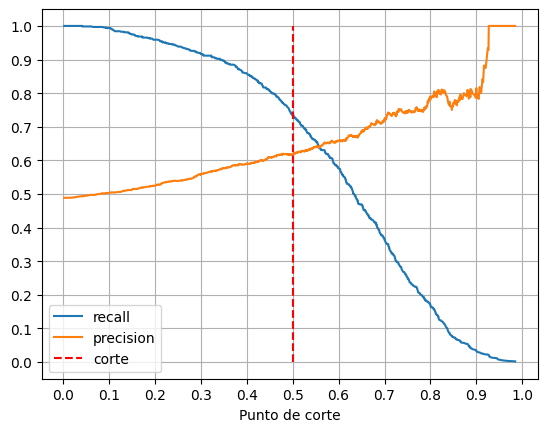

In [298]:
show_precision_recall_curve(y_test, y_pred_proba, punto_corte=0.5)

In [299]:
probas_propios = cnn_melspec.predict(X_propios_melspec_arr)

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 317ms/step


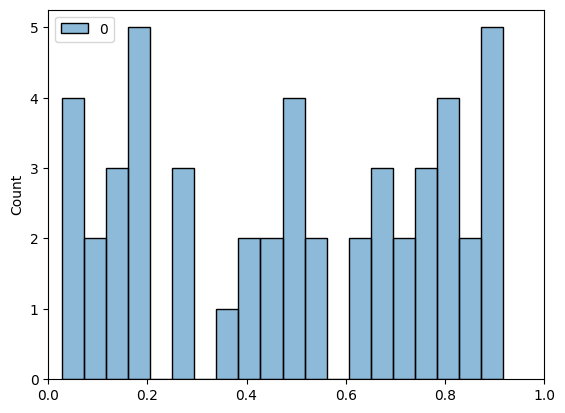

In [300]:
sns.histplot(probas_propios, bins=20)
plt.xlim(0, 1);

In [301]:
df_probas = pd.DataFrame({'file': files, 'proba': probas_propios.flatten()})
df_probas.sort_values(by='proba', ascending=False).head(10)

,file,proba
46,respiracion8_ciclo_3.wav,0.916299
41,respiracion7_ciclo_3.wav,0.909581
40,respiracion7_ciclo_2.wav,0.902930
0,respiracion1_ciclo_1.wav,0.900427
23,respiracion4_ciclo_5.wav,0.886700
42,respiracion7_ciclo_4.wav,0.853446
47,respiracion8_ciclo_4.wav,0.850968
29,respiracion5_ciclo_4.wav,0.815206
39,respiracion7_ciclo_1.wav,0.794838
10,respiracion2_ciclo_4.wav,0.790146


# Modelos Datos Adaptados

In [302]:
dataset = 'bp_wd2'

In [303]:
pipeline_melspec = Pipeline([
    ('resampler', Resampler()),
    ('bandpass', BandPassFilter()),
    ('wavelet_denoiser', WaveletDenoiser()),
    ('melspec', MelSpectrogramTransformer()),
    ('padder', SpectrogramPadder()),
    ('flatten', FlattenTransformer())
])

pipeline_features = Pipeline([
    ('resampler', Resampler()),
    ('bandpass', BandPassFilter()),
    ('wavelet_denoiser', WaveletDenoiser()),
    ('feature_extractor', FeatureExtractor())
])

## Random Forest 

### Mel Espectrogramas

In [304]:
test_data = np.load(f'./dataset/ciclos_procesados/{dataset}/test_melspectrogram.npz')
X_test = test_data['X']
y_test = test_data['y']

In [305]:
melspec_rf = joblib.load(f'./modelos_clasicos/modelos/{dataset}/melspec_rf.pkl')

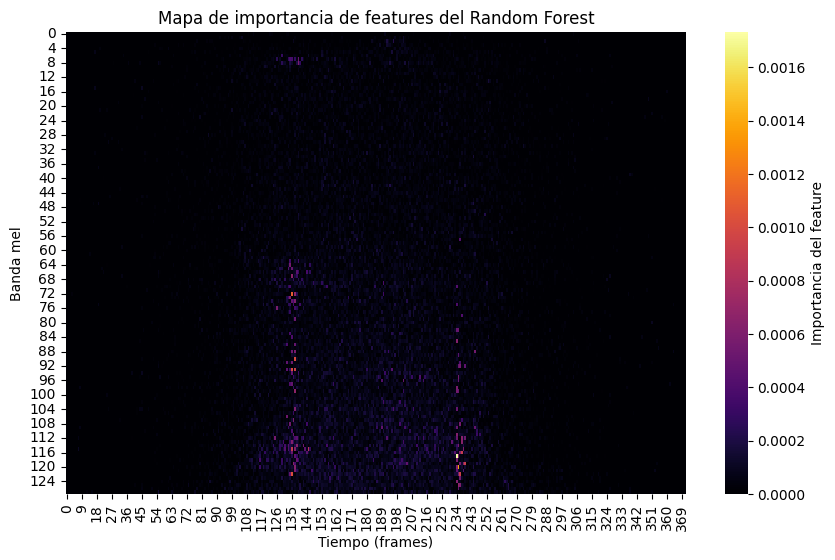

In [306]:
importances = melspec_rf.feature_importances_

n_mels = N_MELS
n_frames = importances.shape[0] // n_mels

importance_img = importances.reshape((n_mels, n_frames))
importance_img = np.flipud(importance_img)

plt.figure(figsize=(10, 6))
sns.heatmap(
    importance_img,
    cmap='inferno',
    cbar_kws={'label': 'Importancia del feature'},
)
plt.xlabel("Tiempo (frames)")
plt.ylabel("Banda mel")
plt.title("Mapa de importancia de features del Random Forest");

In [307]:
y_pred = melspec_rf.predict(X_test)
y_pred_proba = melspec_rf.predict_proba(X_test)[:, 1]

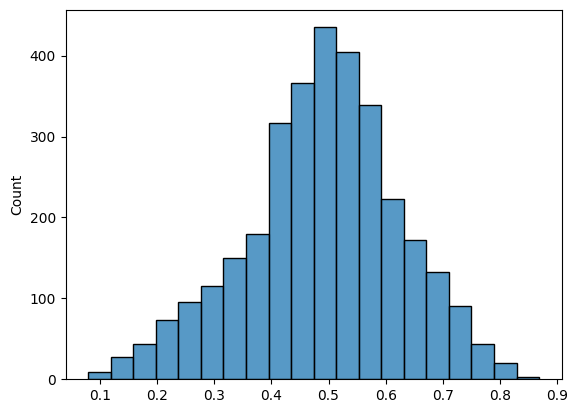

In [308]:
sns.histplot(y_pred_proba, bins=20);

In [309]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.62      0.63      0.62      1657
           1       0.60      0.60      0.60      1582

    accuracy                           0.61      3239
   macro avg       0.61      0.61      0.61      3239
weighted avg       0.61      0.61      0.61      3239



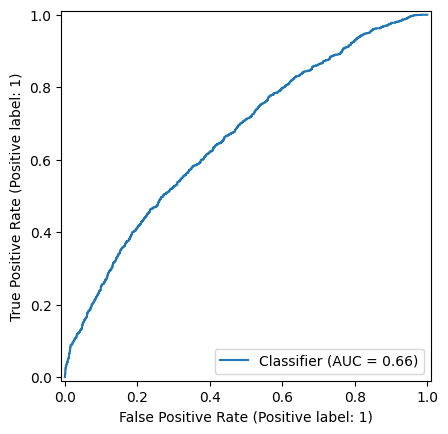

In [310]:
RocCurveDisplay.from_predictions(y_test, y_pred_proba);

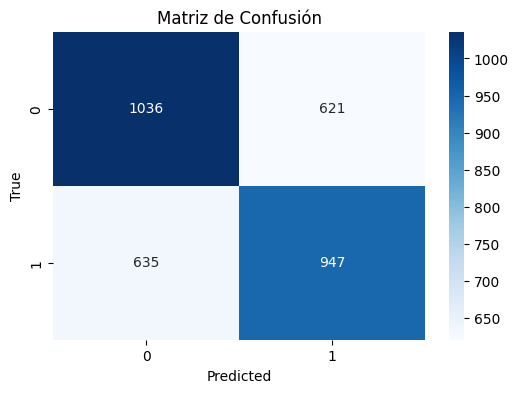

In [311]:
show_confusion_matrix(y_test, y_pred)

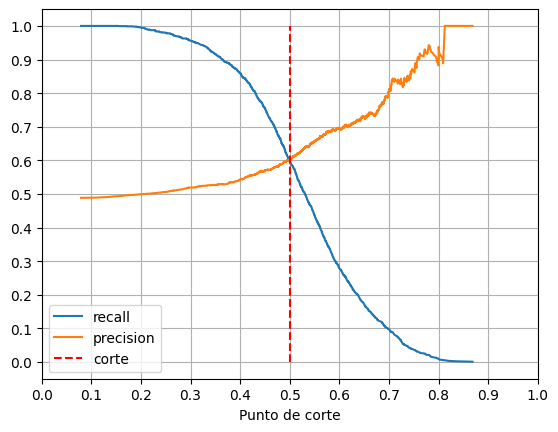

In [312]:
show_precision_recall_curve(y_test, y_pred_proba, punto_corte=0.5)

In [313]:
X_propios_melspec = pipeline_melspec.fit_transform(paths)

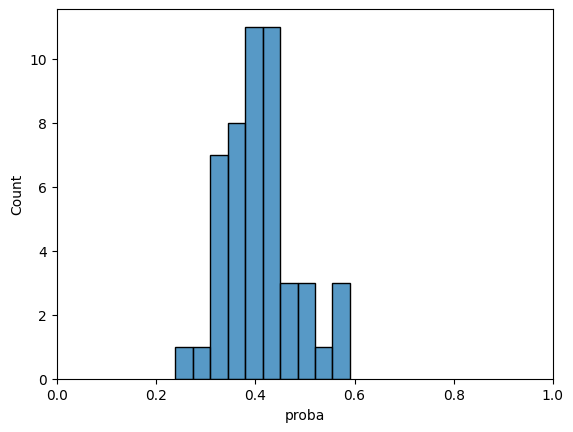

In [314]:
probas_propios = melspec_rf.predict_proba(X_propios_melspec)[:, 1]
df_probas = pd.DataFrame({
    'file': files,
    'proba': probas_propios
})
sns.histplot(df_probas, x='proba', bins=10)
plt.xlim(0, 1);

In [315]:
df_probas.sort_values(by='proba', ascending=False).head(10)

,file,proba
23,respiracion4_ciclo_5.wav,0.590800
22,respiracion4_ciclo_4.wav,0.587437
30,respiracion5_ciclo_5.wav,0.579093
20,respiracion4_ciclo_2.wav,0.551606
40,respiracion7_ciclo_2.wav,0.517825
39,respiracion7_ciclo_1.wav,0.516558
11,respiracion2_ciclo_5.wav,0.502816
19,respiracion4_ciclo_1.wav,0.470567
27,respiracion5_ciclo_2.wav,0.468948
41,respiracion7_ciclo_3.wav,0.465088


### Atributos de audio

In [316]:
test_data = np.load(f'./dataset/ciclos_procesados/{dataset}/test_features.npz')
X_test = test_data['X']
y_test = test_data['y']

In [317]:
feat_rf = joblib.load(f'./modelos_clasicos/modelos/{dataset}/features_rf.pkl')

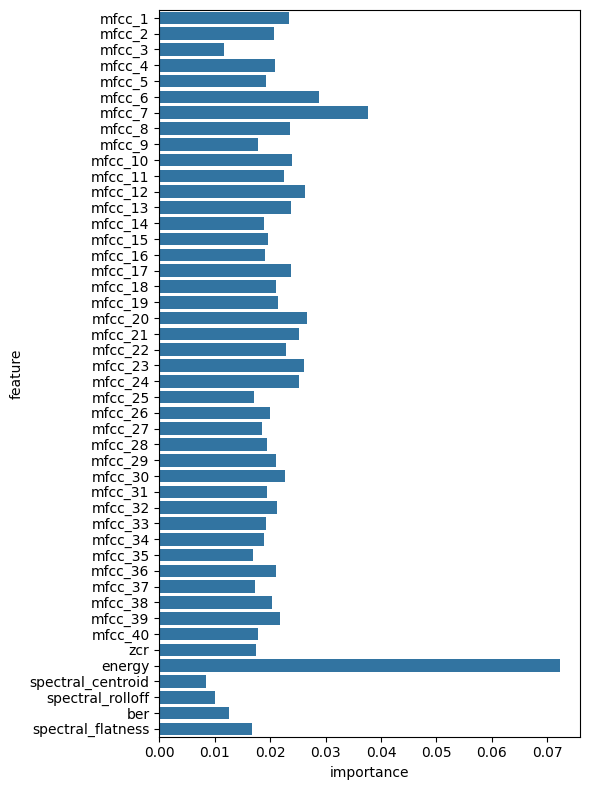

In [318]:
importances = feat_rf.feature_importances_
columns = ['mfcc_' + str(i) for i in range(1, 41)] + ['zcr', 'energy', 'spectral_centroid', 'spectral_rolloff', 'ber', 'spectral_flatness']

importance_df = pd.DataFrame({
    'feature': columns,
    'importance': importances
})
plt.figure(figsize=(6, 8))
sns.barplot(data=importance_df, x='importance', y='feature')
plt.tight_layout();

In [319]:
y_pred = feat_rf.predict(X_test)
y_pred_proba = feat_rf.predict_proba(X_test)[:, 1]

In [320]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.69      0.68      0.68      1673
           1       0.66      0.68      0.67      1566

    accuracy                           0.68      3239
   macro avg       0.68      0.68      0.68      3239
weighted avg       0.68      0.68      0.68      3239



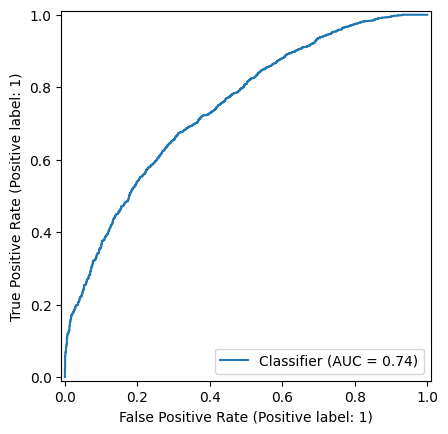

In [321]:
RocCurveDisplay.from_predictions(y_test, y_pred_proba);

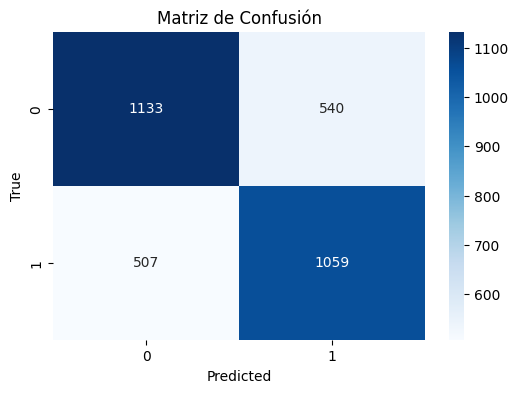

In [322]:
show_confusion_matrix(y_test, y_pred)

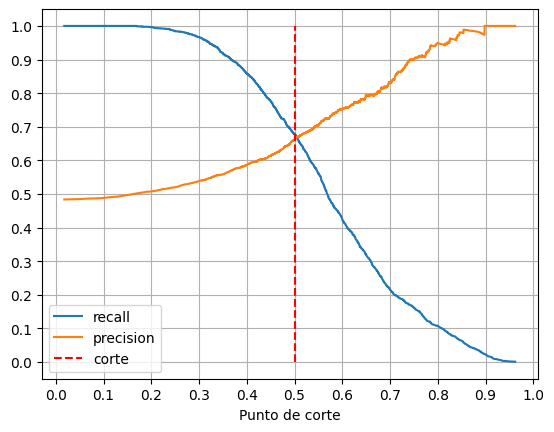

In [323]:
show_precision_recall_curve(y_test, y_pred_proba, punto_corte=0.5)

In [324]:
X_propios_features = pipeline_features.fit_transform(paths)

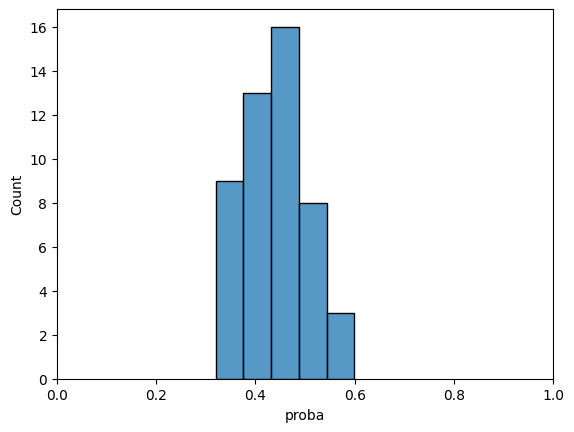

In [325]:
probas_propios = feat_rf.predict_proba(X_propios_features)[:, 1]
df_probas = pd.DataFrame({
    'file': files,
    'proba': probas_propios
})
sns.histplot(df_probas, x='proba', bins=5)
plt.xlim(0, 1);

In [329]:
df_probas.sort_values(by='proba', ascending=False).reset_index(drop=True).head(26)

,file,proba
0,respiracion4_ciclo_6.wav,0.599410
1,respiracion8_ciclo_5.wav,0.557262
2,respiracion8_ciclo_1.wav,0.546838
3,respiracion7_ciclo_5.wav,0.537090
4,respiracion8_ciclo_3.wav,0.534064
5,respiracion4_ciclo_1.wav,0.533143
6,respiracion7_ciclo_2.wav,0.521810
7,respiracion5_ciclo_6.wav,0.503201
8,respiracion5_ciclo_1.wav,0.497801
9,respiracion7_ciclo_3.wav,0.496304


## CNN

### Imagenes de Mel Espectrogramas

In [224]:
X_propios = load_images(f'./audios_propios/ciclos_energy_based_mel_images/pad/', target_size=(372, 128))

In [225]:
test_dir = f'./dataset/ciclos_procesados/{dataset}/cnn/test_imgs'

X_test, y_test = load_image_dataset(test_dir, target_size=(372, 128))

In [226]:
cnn_img = keras.models.load_model(f'./neural_network/modelos/{dataset}.keras')

In [227]:
y_pred_proba = cnn_img.predict(X_test)
y_pred = (y_pred_proba >= 0.5).astype(int)

102/102 ━━━━━━━━━━━━━━━━━━━━ 57s 552ms/step


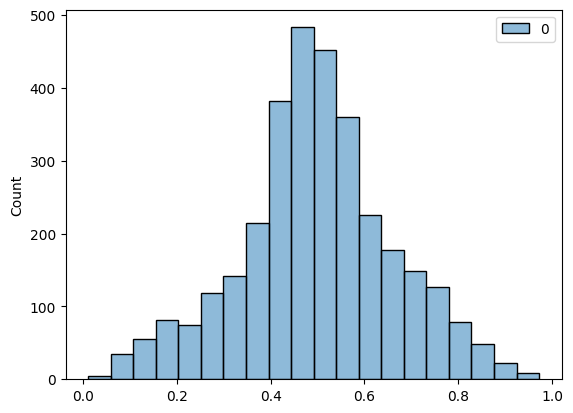

In [228]:
sns.histplot(y_pred_proba, bins=20);

In [229]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.62      0.62      0.62      1657
           1       0.60      0.60      0.60      1582

    accuracy                           0.61      3239
   macro avg       0.61      0.61      0.61      3239
weighted avg       0.61      0.61      0.61      3239



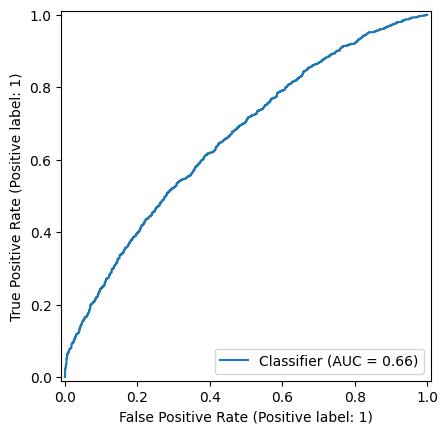

In [230]:
RocCurveDisplay.from_predictions(y_test, y_pred_proba);

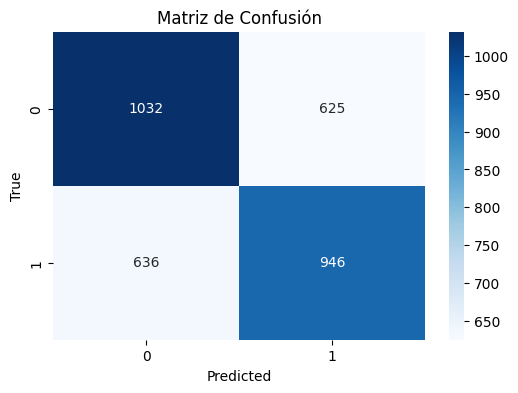

In [231]:
show_confusion_matrix(y_test, y_pred)

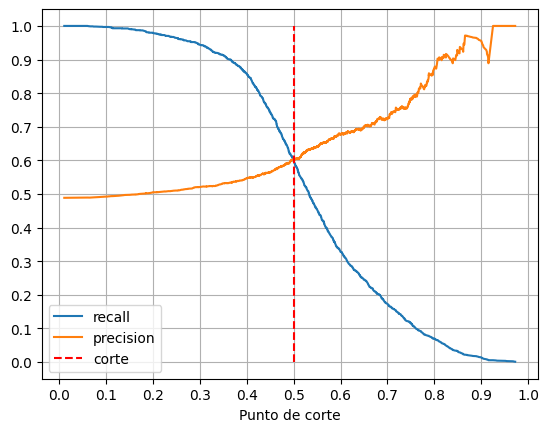

In [232]:
show_precision_recall_curve(y_test, y_pred_proba, punto_corte=0.5)

In [233]:
probas_propios = cnn_img.predict(X_propios)

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 373ms/step


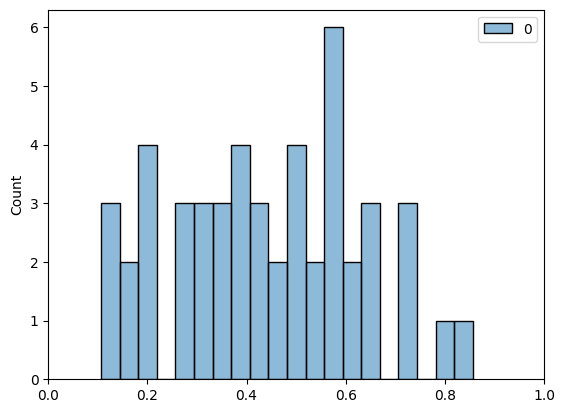

In [234]:
sns.histplot(probas_propios, bins=20)
plt.xlim(0, 1);

In [235]:
df_probas = pd.DataFrame({'file': files, 'proba': probas_propios.flatten()})
df_probas.sort_values(by='proba', ascending=False).head(10)

,file,proba
22,respiracion4_ciclo_4.wav,0.856231
24,respiracion4_ciclo_6.wav,0.806850
17,respiracion3_ciclo_5.wav,0.741375
13,respiracion3_ciclo_1.wav,0.716103
29,respiracion5_ciclo_4.wav,0.714430
23,respiracion4_ciclo_5.wav,0.659889
30,respiracion5_ciclo_5.wav,0.635726
19,respiracion4_ciclo_1.wav,0.632469
32,respiracion6_ciclo_1.wav,0.614281
16,respiracion3_ciclo_4.wav,0.598287


### Mel Espectrograma (Matriz)

In [236]:
test_data = np.load(f'./dataset/ciclos_procesados/{dataset}/cnn/test_melspectrogram.npz')
X_test = test_data['X']
y_test = test_data['y']

In [237]:
X_test = X_test.reshape(-1, 128, 372, 1)
X_test = np.repeat(X_test, 3, axis=-1)

In [238]:
X_propios_melspec_arr = X_propios_melspec.reshape(-1, 128, 372, 1)
X_propios_melspec_arr = np.repeat(X_propios_melspec_arr, 3, axis=-1)

In [239]:
cnn_melspec = keras.models.load_model(f'./neural_network/modelos/{dataset}_melspec.keras')

In [240]:
y_pred_proba = cnn_melspec.predict(X_test)
y_pred = (y_pred_proba >= 0.5).astype(int)

102/102 ━━━━━━━━━━━━━━━━━━━━ 57s 546ms/step


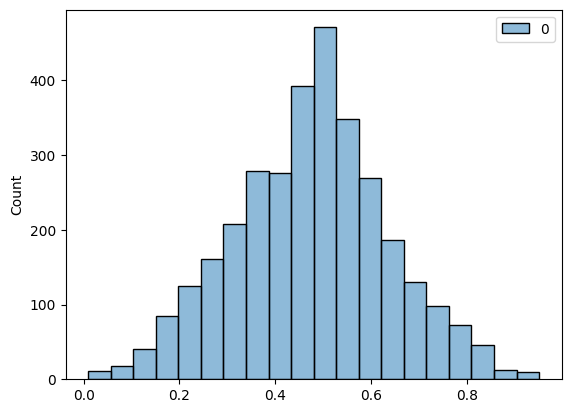

In [241]:
sns.histplot(y_pred_proba, bins=20);

In [242]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.61      0.66      0.63      1657
           1       0.61      0.56      0.59      1582

    accuracy                           0.61      3239
   macro avg       0.61      0.61      0.61      3239
weighted avg       0.61      0.61      0.61      3239



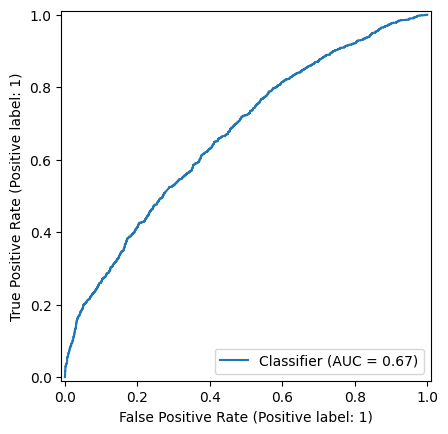

In [243]:
RocCurveDisplay.from_predictions(y_test, y_pred_proba);

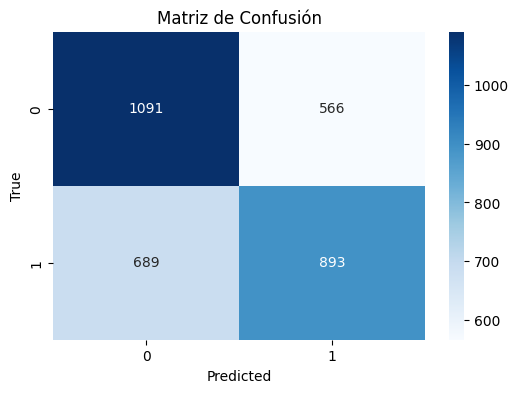

In [244]:
show_confusion_matrix(y_test, y_pred)

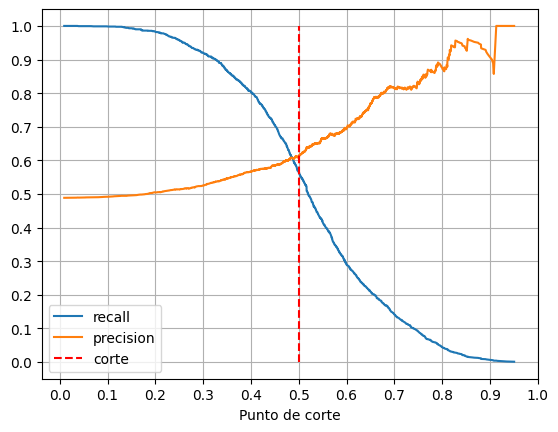

In [245]:
show_precision_recall_curve(y_test, y_pred_proba, punto_corte=0.5)

In [246]:
probas_propios = cnn_melspec.predict(X_propios_melspec_arr)

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 345ms/step


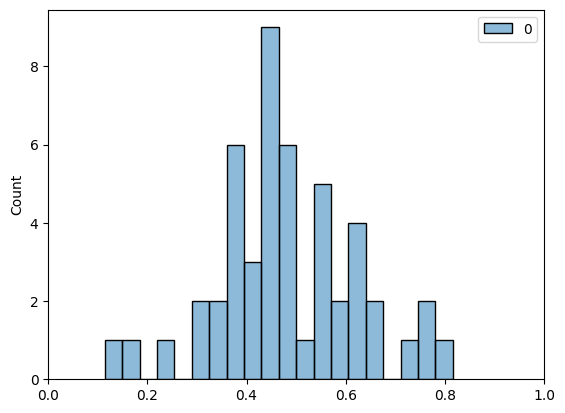

In [247]:
sns.histplot(probas_propios, bins=20)
plt.xlim(0, 1);

In [248]:
df_probas = pd.DataFrame({'file': files, 'proba': probas_propios.flatten()})
df_probas.sort_values(by='proba', ascending=False).head(10)

,file,proba
22,respiracion4_ciclo_4.wav,0.816023
24,respiracion4_ciclo_6.wav,0.777092
23,respiracion4_ciclo_5.wav,0.766518
7,respiracion2_ciclo_1.wav,0.711378
16,respiracion3_ciclo_4.wav,0.664359
35,respiracion6_ciclo_4.wav,0.642153
18,respiracion3_ciclo_6.wav,0.633848
20,respiracion4_ciclo_2.wav,0.629558
21,respiracion4_ciclo_3.wav,0.613788
13,respiracion3_ciclo_1.wav,0.610996
